In [9]:
import cv2 as cv
import numpy as np
import glob
import pickle
import ml_metrics
import math
import pandas as pd
import os
import yaml

from matplotlib import offsetbox
from sklearn import manifold, datasets, decomposition, discriminant_analysis
from matplotlib import pyplot as plt 
from sklearn.cluster import KMeans
from sklearn.cluster import MeanShift, estimate_bandwidth
from sklearn.cluster import OPTICS, cluster_optics_dbscan
import matplotlib.gridspec as gridspec
from random import randint
from mpl_toolkits.mplot3d import Axes3D
import mayavi

from evaluation_funcs import performance_accumulation_pixel
from evaluation_funcs import performance_evaluation_pixel
from bbox_iou import bbox_iou
from extract_features import extract_features
from compute_mask import compute_mask
from compute_mask_old import compute_mask_old
from text_removal_mask import text_removal_mask
from text_removal_mask2 import find_text
from search_queries import search
from compute_lbp import compute_lbp
from compute_hog import compute_hog
from compute_dct import compute_dct
from get_text import get_text
from compute_SIFT import compute_SIFT
from compute_SURF import compute_SURF
from search_matches import search_matches_FLANN
from search_matches import search_matches_BF

## PARAMETERS ##
NBINS = 32        # Number of bins (from 0 to 255)
DIVISIONS = 2     # Number of divisions per dimension [2,4,8,...]
COLORSPACE = cv.COLOR_BGR2HSV

def embedding_plot(X, title):
    x_min, x_max = np.min(X, axis=0), np.max(X, axis=0)
    X = (X - x_min) / (x_max - x_min)

    plt.figure()
    ax = plt.subplot(aspect='equal')
    sc = ax.scatter(X[:,0], X[:,1], lw=0, s=40) # c=y/10.
    
    plt.xticks([]), plt.yticks([])
    plt.title(title)

print('Done')

Done


In [10]:
database = []
for f in sorted(glob.glob('../database/*.jpg')):
    # Read image
    img = cv.imread(f, cv.IMREAD_COLOR)

    # Colorspace changes
    img_gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
    img = cv.cvtColor(img, COLORSPACE)
    
    
    descriptor_2 = extract_features(img, None, NBINS, DIVISIONS)
    """ 
    size = 32
    hue = img[:,:,0]
    hue = cv.resize(hue, (size,size))
    hue = hue/179.0
    
    img_gray = cv.resize(img_gray, (size,size))
    img_dct = cv.dct(np.float32(img_gray))
    img_dct = np.uint8(img_dct)/255.0
    
    aux1 = np.hstack(img_dct).tolist()
    aux2 = np.hstack(hue).tolist()
    descriptor = aux1 + aux2

    
    # Compute descriptors
    #descriptor_1 = compute_lbp(img_gray, None, 8, 16, 8, 2, 'uniform')
    #descriptor_2 = extract_features(img, None, NBINS, DIVISIONS)
    #descriptor_3 = compute_hog(img, None, 2) 
    #descriptor_4 = compute_dct(img_gray, 128, 16, 256)
    #descriptor_4 /= 255.0
    #descriptor_4 = descriptor_4.tolist()
    #descriptor_5 = compute_SIFT(img_gray, None, SIZE)
    #descriptor_6 = compute_SURF(img_gray, None, SIZE)
    
    #descriptor = descriptor_4 + descriptor_2 # + descriptor_4
    """
    descriptor = descriptor_2
    # Store the descriptor
    database.append(np.hstack(descriptor))

In [84]:
""" OPCIONAL: LLEGIR LES FEATURES GENERADES PER LA MOBILENET """
database = pickle.load(open('../features.pkl','rb'))
print(np.shape(database))

(279, 20480)


(480, 1)
['#09BB49', '#07C11D', '#CD559E', '#448769', '#CDE96C', '#5EE289', '#F74E5C', '#735314', '#9784A8', '#2D5166']


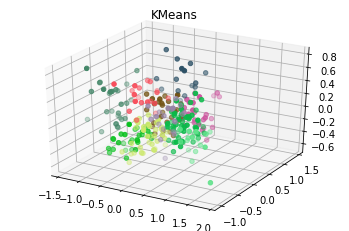

In [12]:
""" PCA """
N_COMPONENTS = 3

# Scatter plot PCA
print(np.shape(descriptor))
db = np.array(database)
n_samples, n_features = db.shape

X_pca = decomposition.PCA(n_components=N_COMPONENTS).fit_transform(db)

# Store results of PCA in a data frame
result=pd.DataFrame(X_pca, columns=['PCA%i' % i for i in range(3)])


k=10
k_means = KMeans(init='k-means++', n_clusters=k, n_init=100)
k_means.fit(X_pca)
labels = k_means.labels_
k_means_cluster_centers = k_means.cluster_centers_
k_means_labels_unique = np.unique(labels)

colors = []
for i in range(k):
    colors.append('#%06X' % randint(0, 0xFFFFFF))
print(colors)
    
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
for k, col in zip(range(k), colors):
    my_members = labels == k
    cluster_center = k_means_cluster_centers[k]
    ax.scatter(result['PCA0'][my_members], result['PCA1'][my_members], result['PCA2'][my_members], c=col, marker='o')
plt.title('KMeans')    
plt.grid(True)
plt.show()

In [147]:
""" PROVA AMB T-SNE """
# # Scatter plot t-sne
# db = np.array(database)
# n_samples, n_features = db.shape

# X_tsne = manifold.TSNE(n_components=3, init='pca').fit_transform(db)
# result=pd.DataFrame(X_tsne, columns=['PCA%i' % i for i in range(3)])

# k_means = KMeans(init='k-means++', n_clusters=10, n_init=200)
# k_means.fit(X_tsne)
# labels = k_means.labels_
# k_means_cluster_centers = k_means.cluster_centers_
# k_means_labels_unique = np.unique(labels)

# colors = []
# for i in range(k):
#     colors.append('#%06X' % randint(0, 0xFFFFFF))
# print(colors)
    
# fig = plt.figure()
# ax = fig.add_subplot(111, projection='3d')
# for k, col in zip(range(k), colors):
#     my_members = labels == k
#     cluster_center = k_means_cluster_centers[k]
#     ax.scatter(result['PCA0'][my_members], result['PCA1'][my_members], result['PCA2'][my_members], c=col, marker='o')
# plt.title('KMeans')    
# plt.grid(True)
# plt.show()

Room 1


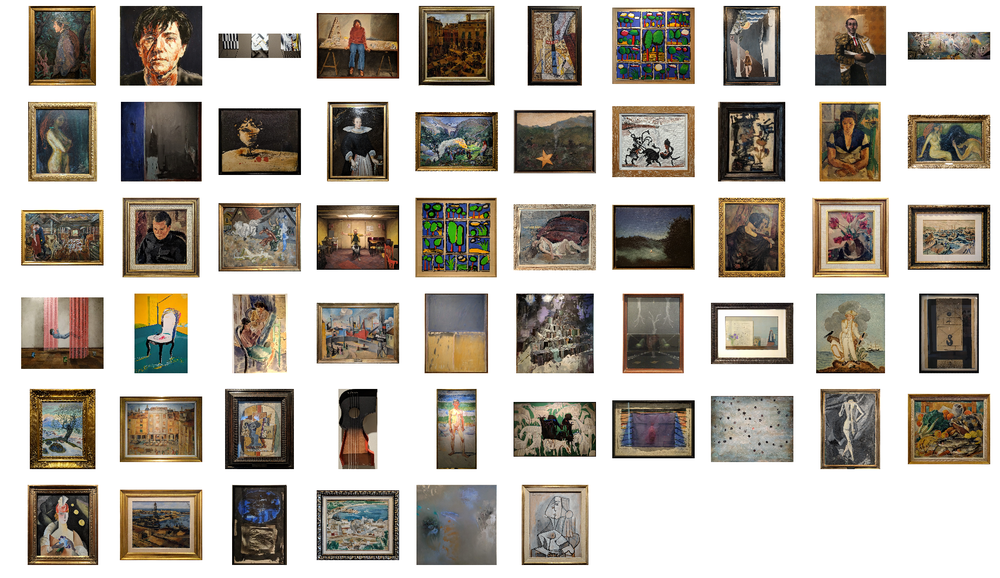

Room 2


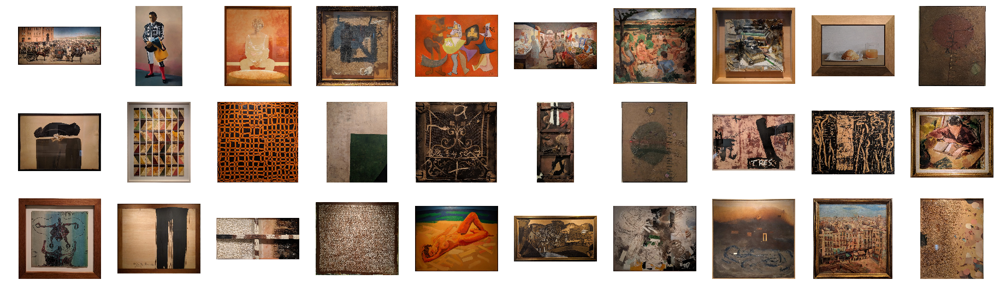

Room 3


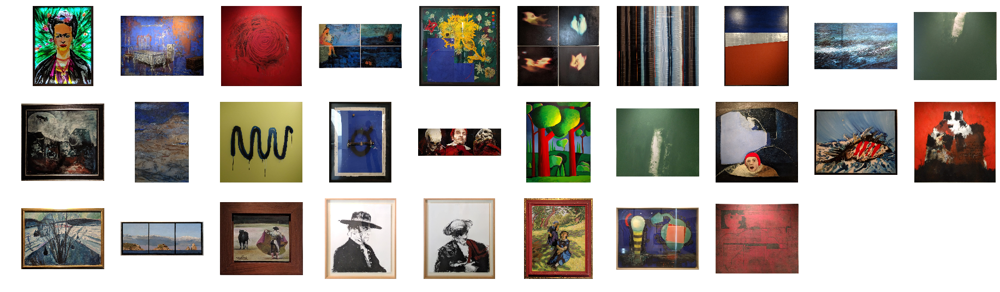

Room 4


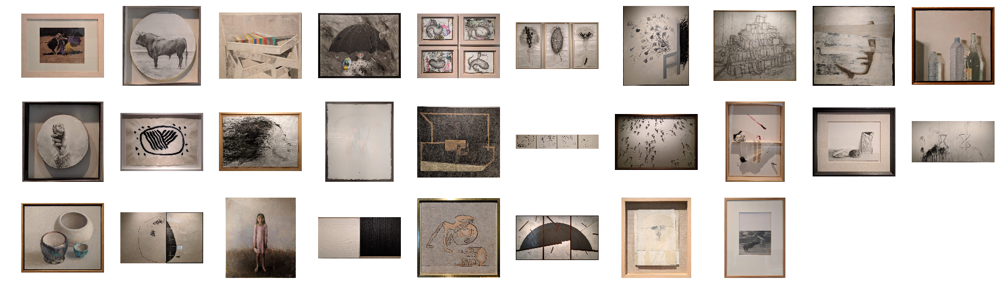

Room 5


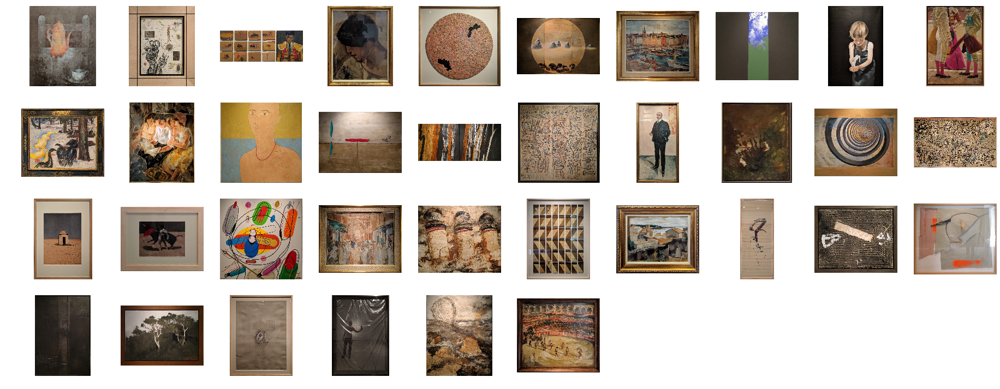

Room 6


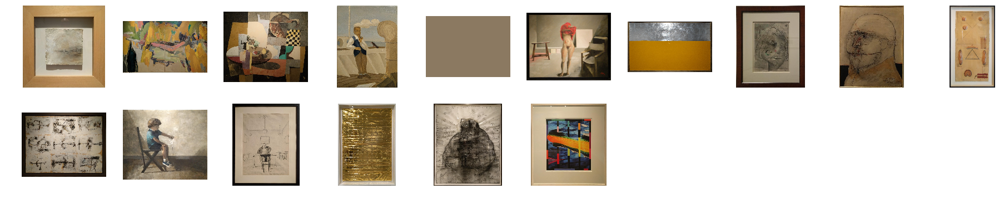

Room 7


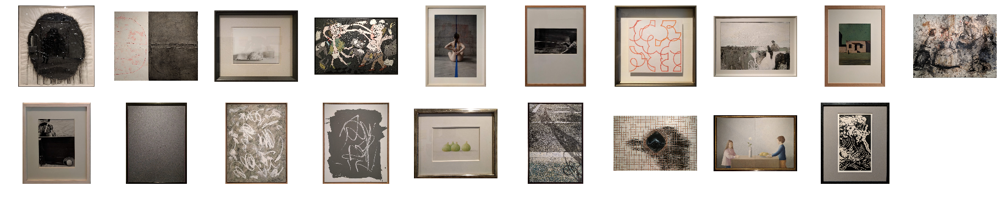

Room 8


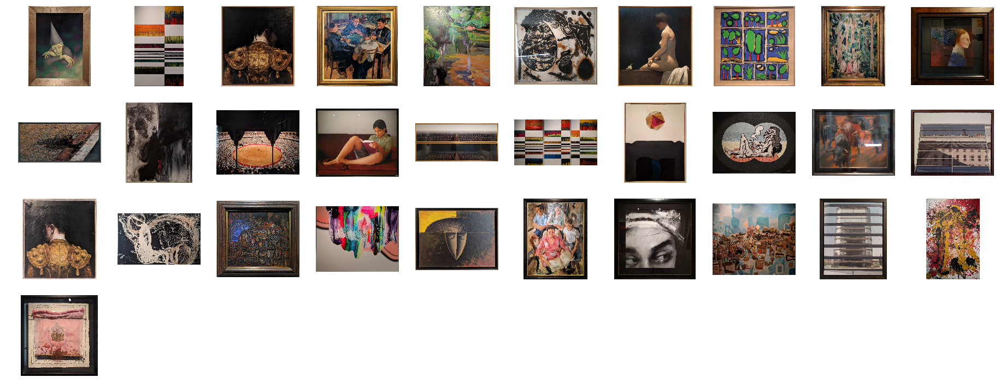

Room 9


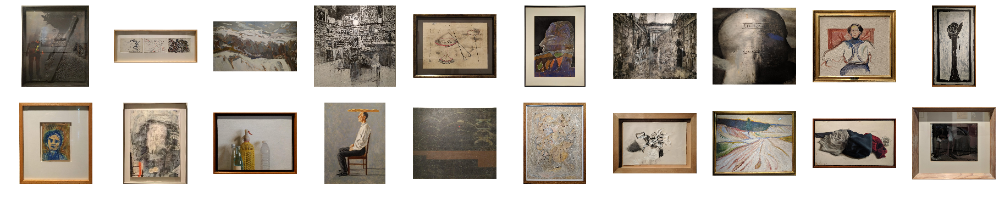

Room 10


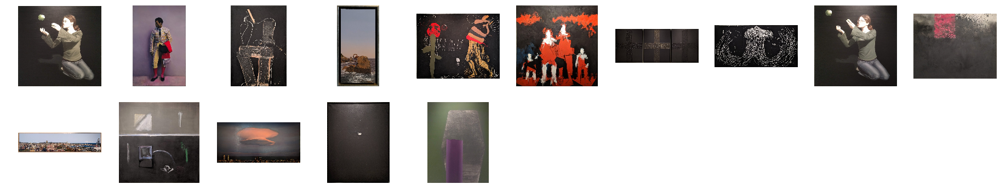

In [13]:
""" PLOT DE LES IMATGES DESIGNADES PER LABELS """
for k in range(10):
    my_members = labels == k
    print('Room ' + str(k+1))
    plt.figure(figsize=(32,32))

    i=0
    n=0
    for f in sorted(glob.glob('../database/*.jpg')):
        if my_members[i] == True :
            img = cv.imread(f, cv.IMREAD_COLOR)
            img = cv.cvtColor(img, cv.COLOR_BGR2RGB)
            ax = plt.subplot(10,10,n+1)
            plt.imshow(img)
            plt.axis('off')
            n += 1
        i+=1
    plt.show()
plt.show()